# QC - Batch Correction - Clustering - Workflow 

Goal: Initial pre-processing to input into Cell Rank 

This processing includes all of the standard quality control including filtering for low quality genes and cells as well as doublet detection and removal. 

This workflow was performed on both Control and scCLEAN samples in exactly the same workflow with exactly the same parameters. The only main distinction was that an additional cluster was identified in the scCLEAN condition at a low louvain resolution. 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pegasus as pg
from pegasus.tools import slicing
from scipy import sparse, stats
from gmr import GMM, MVN, plot_error_ellipses
import seaborn as sns

# Individual Sample QC filtering 

###

Each sample was QC filtered individually in order to account for 10x channel specific issues.

Every sample undergoes: initial filtering and MT removal (miQC - python implementation)
    https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1009290
    
Doublet detection occurs per channel after cluster generation in order to classify heterotypic and homotypic


###

min genes = 200

min UMIs = 500

max UMIs = remove top 1%

MT = miQC threshold 

only genes found in atleast 3 cells 

In [2]:
#function to perform the initial QC filtering 
def perform_QC_filtering(file_path):
    data = pg.read_input(file_path)
    #generate data for filtering but don't actually filter 
    pg.qc_metrics(data, min_genes=200, min_umis=500, mito_prefix='MT-', percent_mito=100)
    #calc threshold for top 1% of the cells according to UMI
    per_cell_metrics = data.obs['n_counts']
    quantile = pd.DataFrame()
    top_umi = per_cell_metrics.quantile(0.99)

    #perform miQC filtering
    #generate data from the anndata.obs
    df = pd.DataFrame(data.obs)
    merged = df[["n_genes","percent_mito"]].values

    x = np.array(df['n_genes'])
    y = np.array(df['percent_mito'])
    
    #model using a gaussian mixture with 2 mixed models
    gmm = GMM(n_components=2, random_state=0)
    gmm.from_samples(merged)

    plt.figure(figsize=(8, 6))
    plt.scatter(x, y, s=5)
    plt.title("Gaussian Mixture Model")
    plot_error_ellipses(plt.gca(), gmm, colors=["r", "g", "b"])
    X_test = np.linspace(0, x.max(), 100)
    Y = gmm.predict(np.array([0]), X_test[:, np.newaxis])
    plt.plot(X_test, Y.ravel(), c="k", lw=2)
    plt.ylabel("Percent Reads MT")
    plt.xlabel("Unique Genes")
    
    #plot the conditional probability distributions
    MVN0 = GMM.extract_mvn(gmm, component_idx=0)
    MVN1 = GMM.extract_mvn(gmm, component_idx=1)

    MVN0_dist = MVN.sample_confidence_region(MVN0, 1000, alpha=0.95)
    MVN0_dist = pd.DataFrame(MVN0_dist)

    MVN1_dist = MVN.sample_confidence_region(MVN1, 1000, alpha=0.95)
    MVN1_dist = pd.DataFrame(MVN1_dist)

    if MVN1_dist[0].mean() > MVN0_dist[0].mean():
        MVN1_dist['label']='alive'
        MVN0_dist['label']='dead'
    else:
        MVN1_dist['label']='dead'
        MVN0_dist['label']='alive'

    merged_dist = pd.concat([MVN1_dist,MVN0_dist])
    merged_dist = merged_dist.reset_index()
    sns.displot(merged_dist, x=1, hue="label", kind="kde", fill=True)
    plt.xlabel("Percent Reads MT")
    alive_cells = merged_dist[merged_dist['label']=='alive']
    alive_array = np.array(alive_cells[1])
    MAD = stats.median_abs_deviation(alive_array)
    median = np.median(alive_array)
    threshold = median + (10*MAD)
    plt.title("Probability Distribution")
    plt.axvline(x = threshold, color = 'red', label = 'MT Threshold: '+str(round(threshold,2)))
    plt.legend()

    #now perform the filtering with all the proper thresholds
    pg.qc_metrics(data, min_genes=200, min_umis=500, max_umis=top_umi, mito_prefix='MT-', percent_mito=threshold)
    pg.filter_data(data)
    percent_3cells = (3/len(data.obs))*100
    pg.identify_robust_genes(data, percent_cells=percent_3cells)
    
    #actually remove non robust genes
    X = data.X.astype(np.float32)
    X = X[:, data.var['robust']==True]
    X = slicing(X, copy=True)
    data.X = sparse.csr_matrix(X)
    data_copy = data[:,data.var['robust']==True]
    data.var = data_copy.var
    print('\nthe final matrix has the following shape: '+str(data.shape)+'\n')
    return data


def save_output(data, output_path):
    pg.write_output(data, output_path)
    
    

Perform MT filtering according to miQC 

Python implementation of miQC: Instead of two linear regressions, two gaussian mixture models 

Just like miQC, use the expectation-maximization (EM), then we can sample from
the estimated distribution or compute conditional distributions

Finally, we determine the proper MT threshold according to the probability of the cell being dead

2022-08-02 09:51:28,890 - pegasusio.readwrite - INFO - 10x file 'VSMC/Protein_Coding_only_raw_files/VSMC_pulmonary_P4_control_filtered_feature_bc_matrix.h5' is loaded.
2022-08-02 09:51:28,891 - pegasusio.readwrite - INFO - Function 'read_input' finished in 0.99s.
2022-08-02 09:51:31,350 - pegasusio.qc_utils - INFO - After filtration, 2867 out of 3170 cell barcodes are kept in UnimodalData object Homo_sapiens.GRCh38.104.chr.protein_coding-rna.
2022-08-02 09:51:31,351 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.19s.
2022-08-02 09:51:31,718 - pegasus.tools.preprocessing - INFO - After filtration, 15840/19937 genes are kept. Among 15840 genes, 14633 genes are robust.
2022-08-02 09:51:31,719 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.37s.

the final matrix has the following shape: (2867, 14633)

2022-08-02 09:51:36,810 - pegasusio.readwrite - INFO - h5ad file 'VSMC/PC_Cleaned_Files/Control_VSMC_pulmonary_P4_control.h

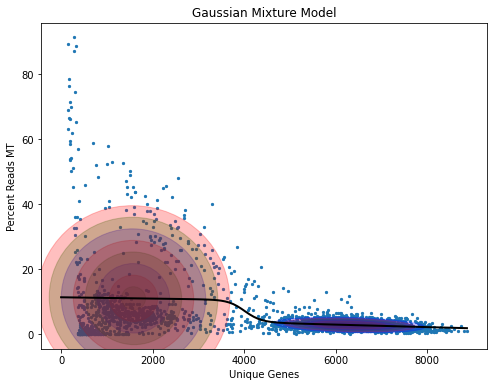

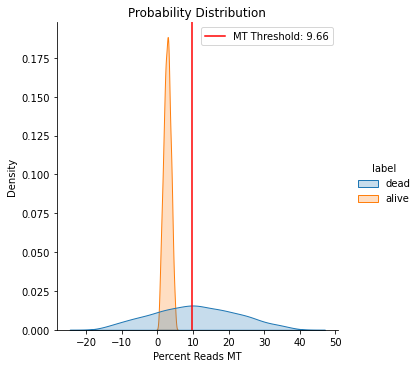

In [10]:
#perform the functions on each 10x channel sample and save to file
data = perform_QC_filtering('VSMC/VSMC_pulmonary_P4_control_filtered_feature_bc_matrix.h5')
save_output(data, 'VSMC/PC_Cleaned_Files/Control_VSMC_pulmonary_P4_control.h5ad')


# Aggregate Samples, Doublet Detection, Batch Correction

In [ ]:
###


#Aggregate into one sample using Pegasus functionality 
#CLI: pegasus aggregate_matrix [path to csv file] [name of output zarr file]


###

In [ ]:
#represents all 4 patients both coronary and pulmonary
#both files underwent the exact same processing shown above with the exact same parameters

control = 'VSMC/PC_Cleaned_Files/Cleaned_control_aggregated.zarr.zip'
depleted = 'VSMC/PC_Cleaned_Files/Cleaned_Depleted_aggregated.zarr.zip'

In [11]:
#input aggregated file representing all 8 samples 
data = pg.read_input("VSMC/PC_Cleaned_Files/Cleaned_Depleted_aggregated.zarr.zip")
print(data.obs['Channel'].value_counts())
data

2022-08-31 16:36:31,533 - pegasusio.readwrite - INFO - zarr file 'VSMC/PC_Cleaned_Files/Cleaned_Depleted_aggregated.zarr.zip' is loaded.
2022-08-31 16:36:31,534 - pegasusio.readwrite - INFO - Function 'read_input' finished in 1.51s.
P1_Coronary     6871
P1_Pulmonary    6741
P3_Pulmonary    6505
P2_Pulmonary    6118
P4_Coronary     5837
P3_Coronary     4696
P2_Coronary     3431
P4_Pulmonary    2511
Name: Channel, dtype: int64


MultimodalData object with 1 UnimodalData: 'Homo_sapiens.GRCh38.104.chr.protein_coding-rna'
    It currently binds to UnimodalData object Homo_sapiens.GRCh38.104.chr.protein_coding-rna

UnimodalData object with n_obs x n_vars = 42710 x 16178
    Genome: Homo_sapiens.GRCh38.104.chr.protein_coding; Modality: rna
    It contains 1 matrix: 'X'
    It currently binds to matrix 'X' as X

    obs: 'n_genes', 'n_counts', 'percent_mito', 'Channel'
    var: 'featureid'
    uns: 'genome', 'modality', 'var_dict'

In [12]:
#go through initial processing with Batch correction
pg.identify_robust_genes(data)
pg.log_norm(data)
pg.highly_variable_features(data, batch='Channel') 
pg.pca(data)
pca_key = pg.run_harmony(data)
pg.neighbors(data, rep=pca_key)
pg.louvain(data, rep=pca_key)

2022-08-31 16:36:34,665 - pegasus.tools.preprocessing - INFO - After filtration, 16178/16178 genes are kept. Among 16178 genes, 14971 genes are robust.
2022-08-31 16:36:34,666 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 3.12s.
2022-08-31 16:36:38,202 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 3.54s.
2022-08-31 16:36:38,970 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.77s.
2022-08-31 16:36:38,997 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2022-08-31 16:36:38,998 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.79s.
2022-08-31 16:36:43,762 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 4.76s.
2022-08-31 16:36:43,763 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 ite

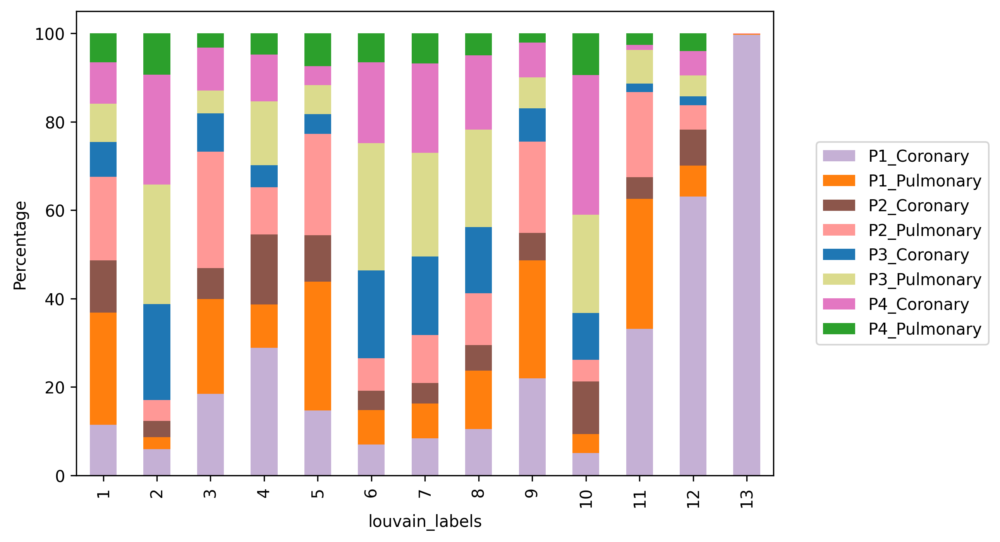

In [13]:
#look at the composition per channel 
pg.compo_plot(data, 'louvain_labels', 'Channel')

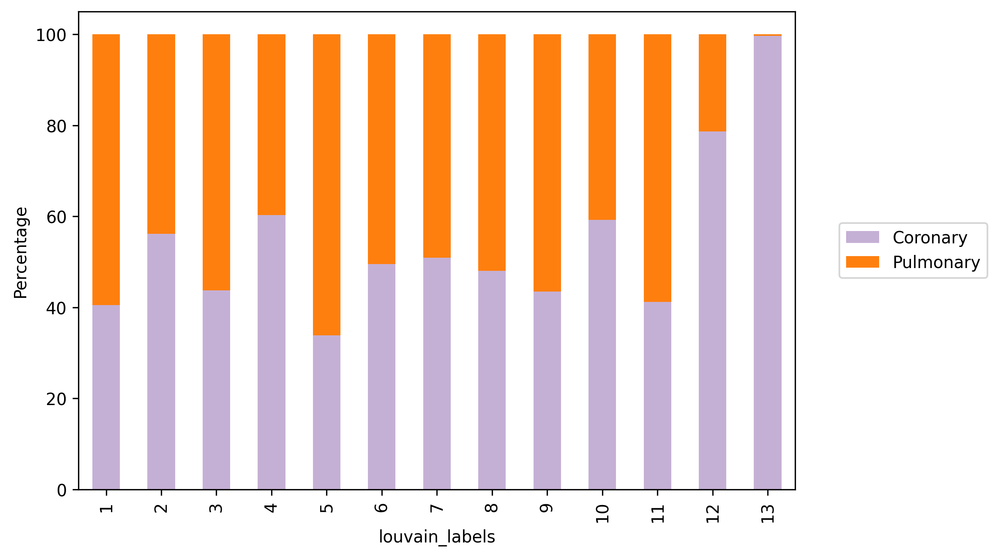

In [14]:
#add additional metadata whether coronary or pulmonary
data.obs['Tissue']='Coronary'
list_samples = ['P1_Pulmonary', 'P2_Pulmonary', 'P3_Pulmonary', 'P4_Pulmonary']
data.obs.loc[data.obs['Channel'].isin(list_samples), 'Tissue'] = 'Pulmonary'
pg.compo_plot(data, 'louvain_labels', 'Tissue')

In [15]:
#calculate percent of starting Tissue contribution
data.obs['Tissue'].value_counts()

Pulmonary    21875
Coronary     20835
Name: Tissue, dtype: int64

2022-08-02 09:57:44,173 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2022-08-02 09:57:44,174 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, precomputed_knn=(array([[    0, 2156, 532, ..., 16123, 21010, 1644],
       [    1, 2346, 2998, ..., 2222, 7031, 830],
       [    2, 34, 3170, ..., 4802, 28050, 419],
       ...,
       [44721, 20589, 13757, ..., 30881, 23345, 21597],
       [44722, 42949, 42493, ..., 43448, 42653, 43490],
       [44723, 44693, 42591, ..., 43973, 43222, 41931]]), array([[ 0.      , 8.246042, 8.258589, ..., 8.746037, 8.786351,
         8.809553],
       [ 0.      , 9.214968, 9.910883, ..., 11.004313, 11.045238,
        11.079451],
       [ 0.      , 11.394   , 11.399468, ..., 13.702002, 13.752707,
        13.793006],
       ...,
       [ 0.      , 10.947244, 10.962036, ..., 11.433517, 11.454732,
        11.491397],
       [ 0.      , 9.060806, 10.443539, .

Epochs completed:   0%|            0/200 [00:00]

Tue Aug  2 09:58:23 2022 Finished embedding
2022-08-02 09:58:23,497 - pegasus.tools.visualization - INFO - Function 'umap' finished in 39.32s.


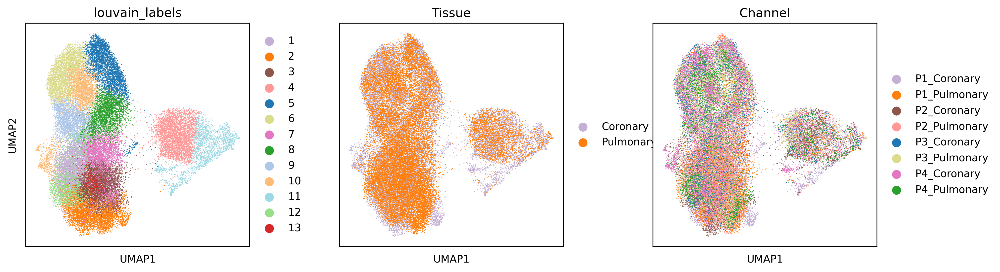

In [15]:
#perform UMAP and dimensionality reduction
pg.umap(data, rep=pca_key)
pg.scatter(data, attrs=['louvain_labels', 'Tissue', 'Channel'], basis='umap', panel_size=(3, 3), nrows=1, dpi=300)

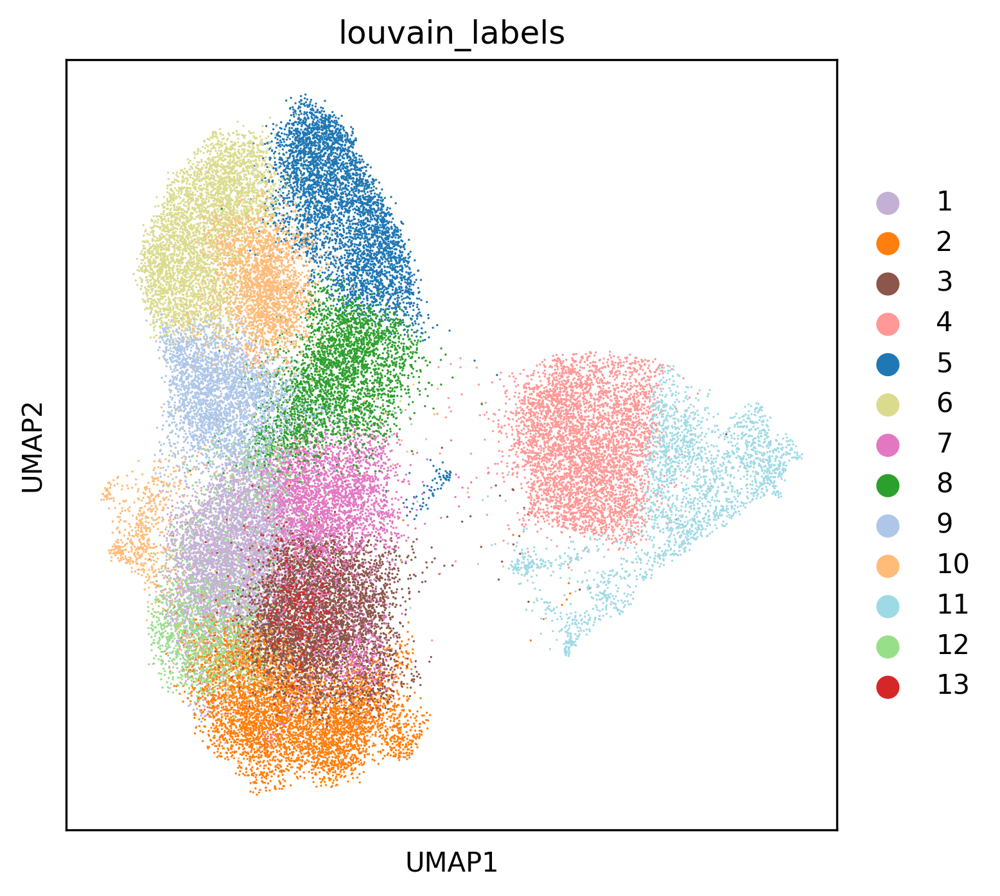

In [16]:
pg.scatter(data, attrs=['louvain_labels'])

2022-08-02 09:58:27,056 - pegasus.tools.preprocessing - INFO - After filtration, 14879/16168 genes are kept. Among 14879 genes, 14561 genes are robust.
2022-08-02 09:58:27,057 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.66s.
2022-08-02 09:58:27,467 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.41s.
2022-08-02 09:58:27,554 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.09s.
2022-08-02 09:58:27,605 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2022-08-02 09:58:27,606 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.14s.
2022-08-02 09:58:33,492 - pegasus.tools.doublet_detection - INFO - Sample P1_Coronary: doublet threshold = 0.0028; total cells = 7353; neotypic doublet rate in simulation = 45.84%; neotypic doublet rate = 9.57%.
2022-08-02 09:58:34,297 - pegasus.tools.doublet_detection - INFO - 

2022-08-02 09:59:22,627 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 2.04s.
2022-08-02 09:59:23,266 - pegasus.tools.doublet_detection - INFO - Doublets are predicted!
2022-08-02 09:59:23,267 - pegasus.tools.doublet_detection - INFO - Function 'infer_doublets' finished in 57.02s.


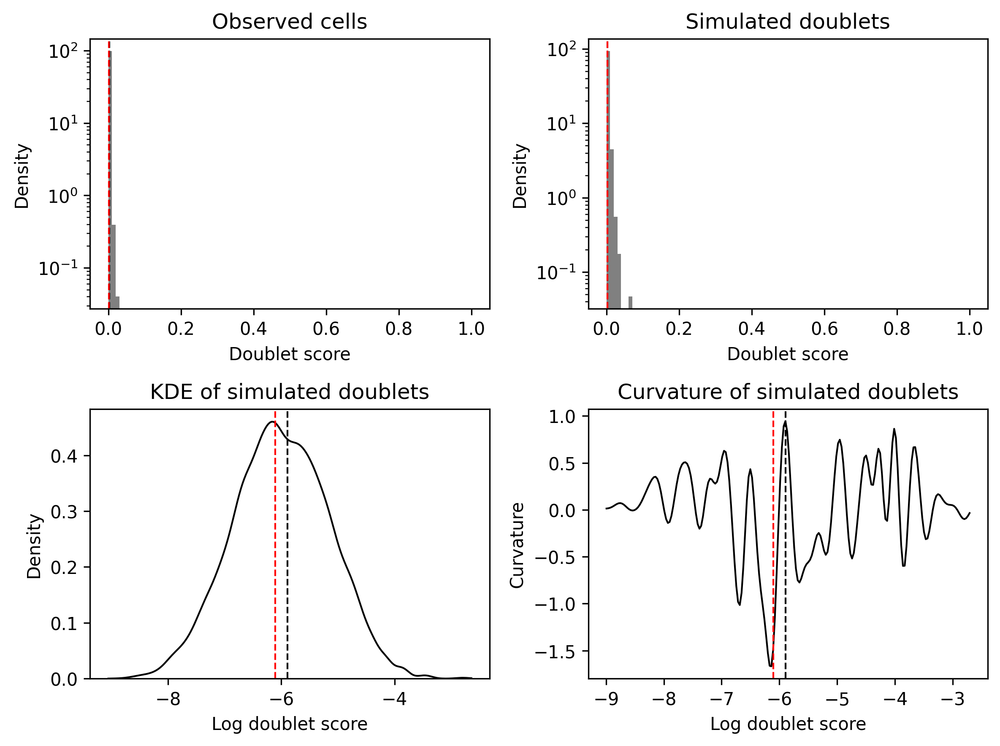

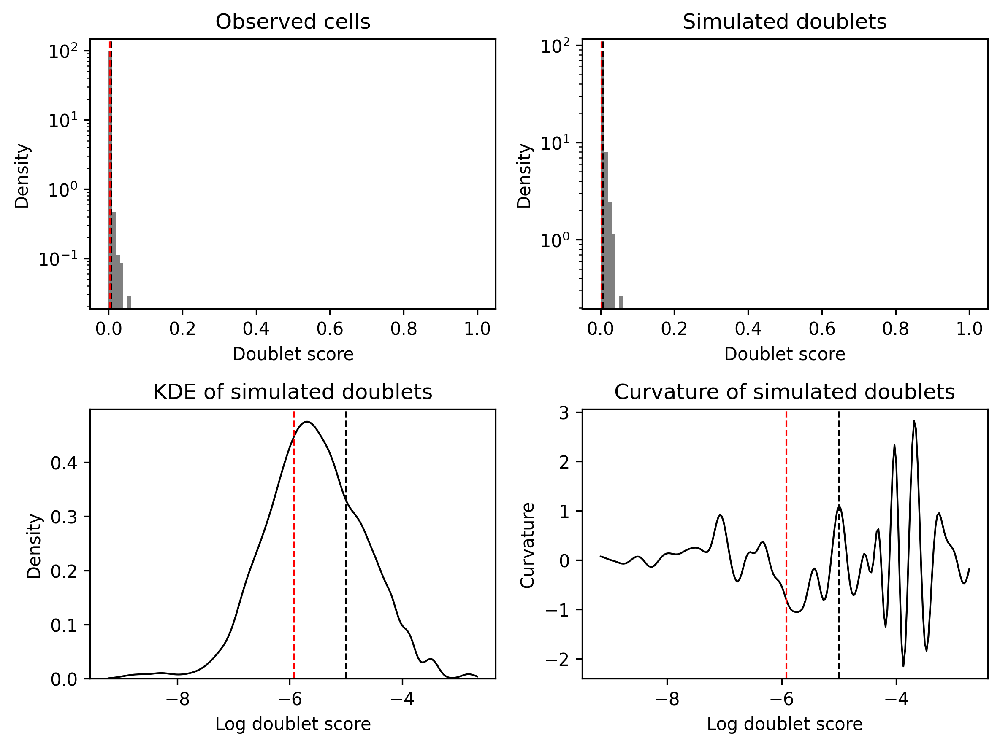

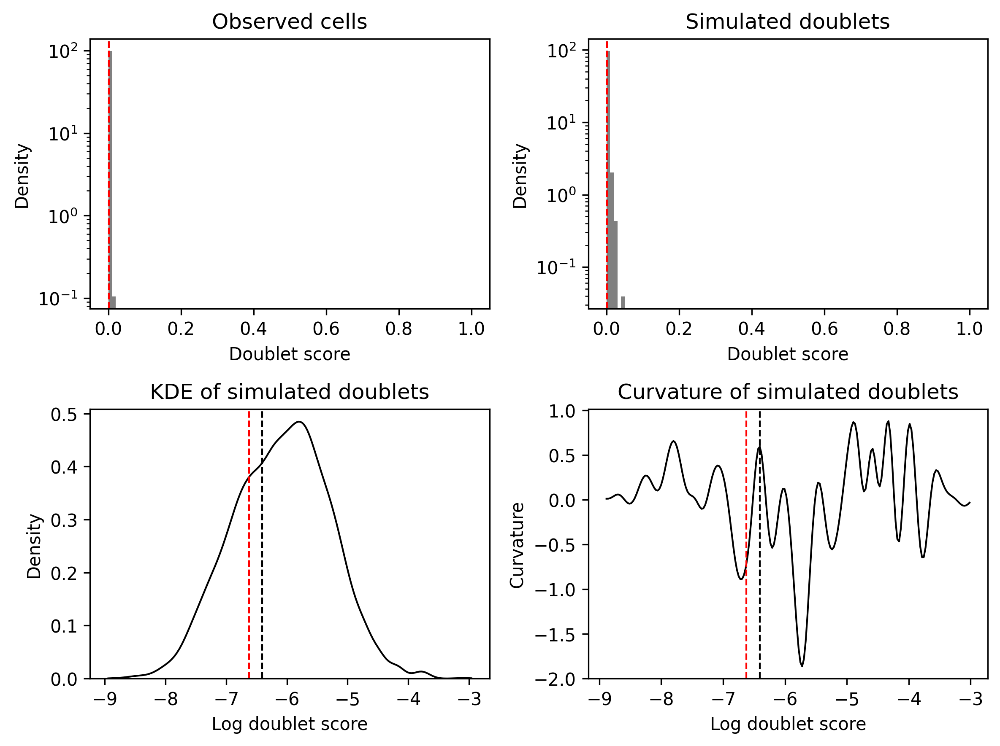

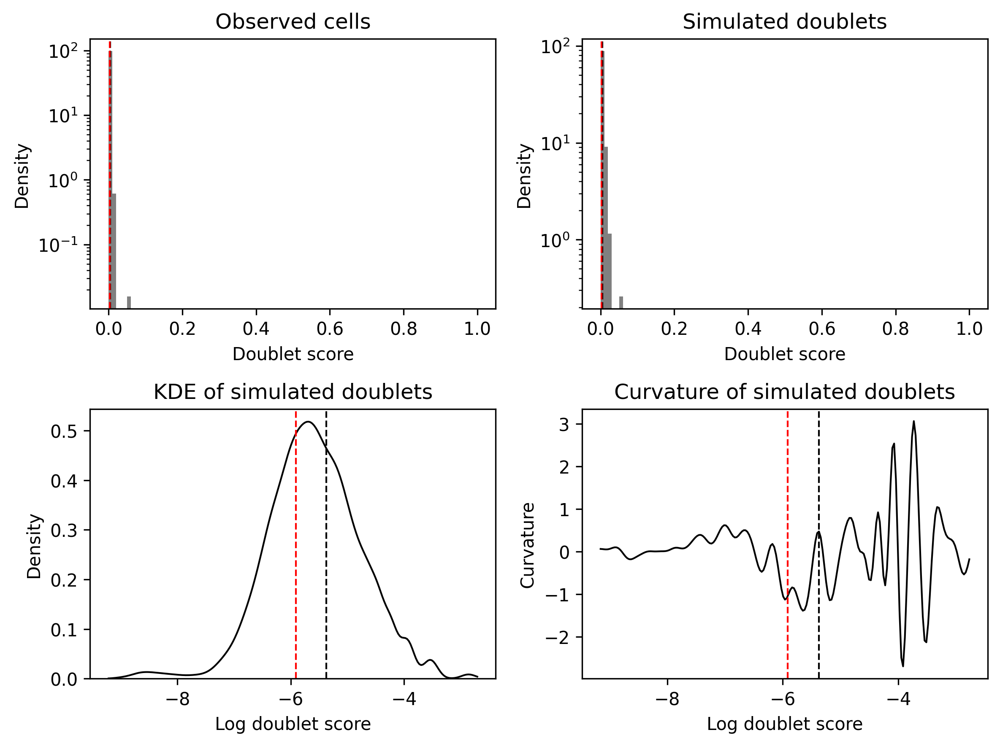

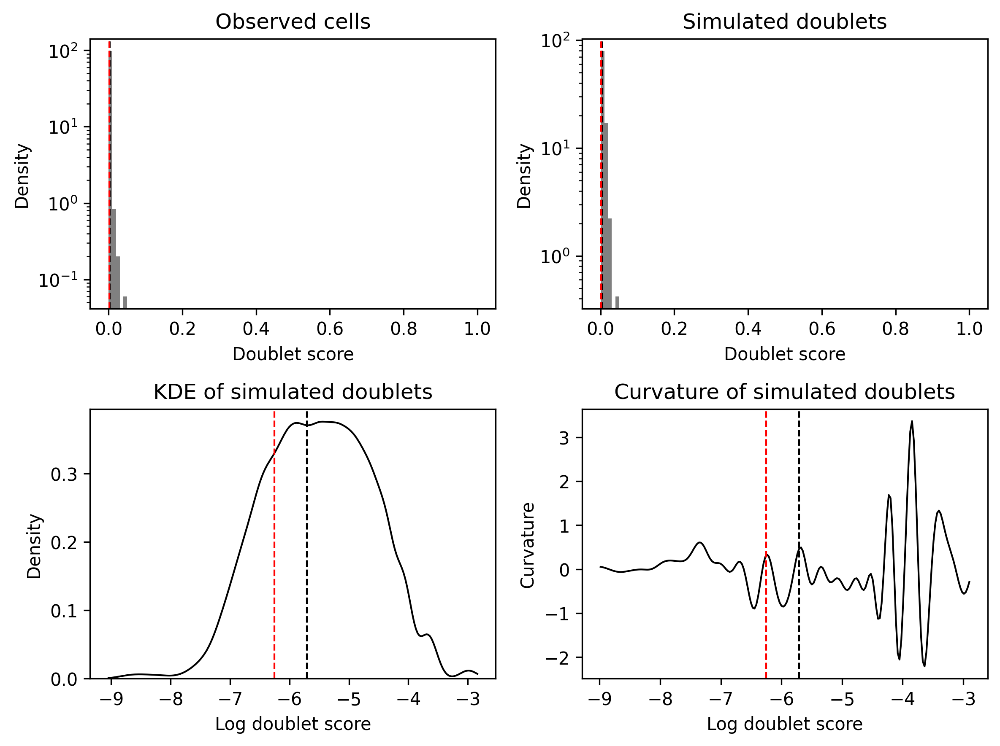

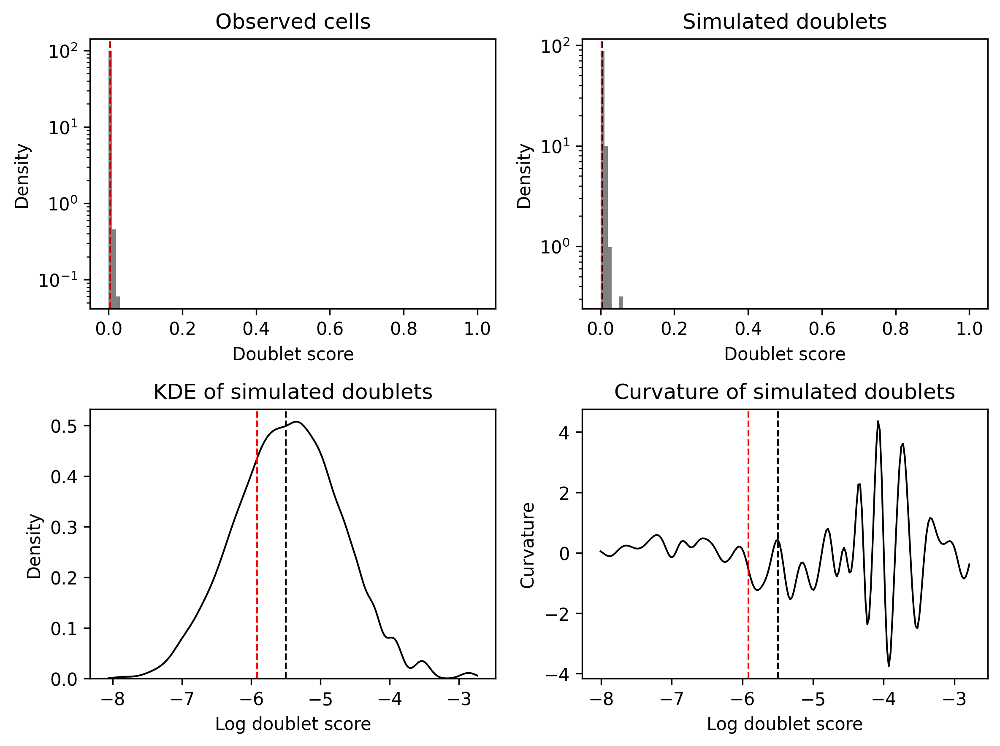

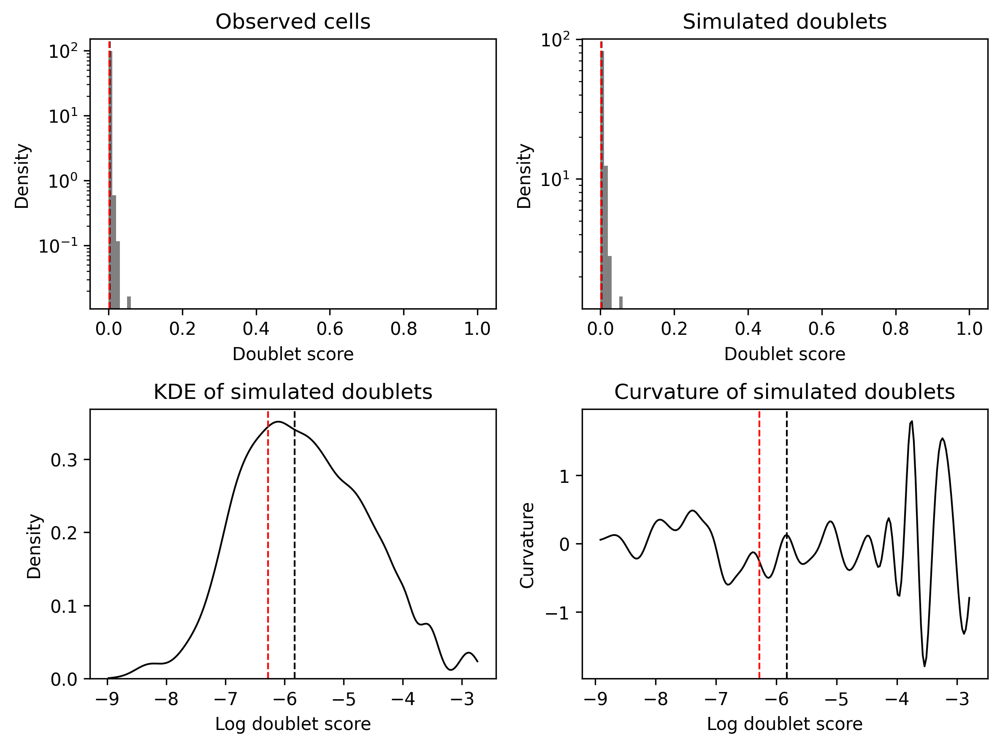

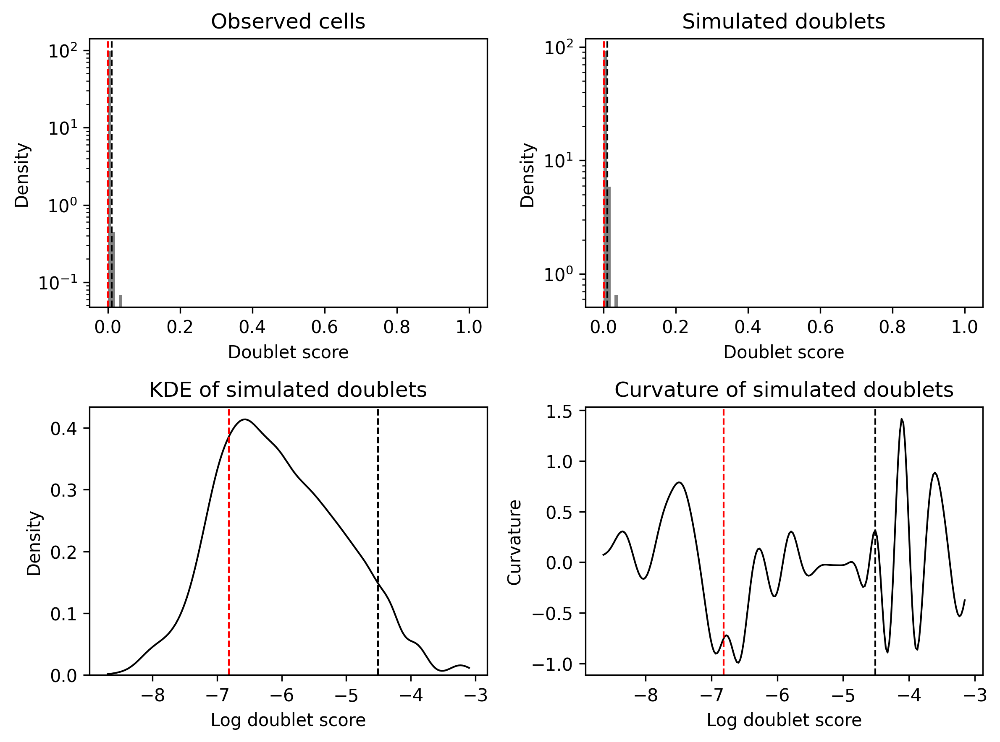

In [17]:
#now that the proper cell clusters have been defined, remove doublets 
#https://pegasus-tutorials.readthedocs.io/en/latest/_static/tutorials/doublet_detection.html
pg.infer_doublets(data, channel_attr = 'Channel', clust_attr = 'louvain_labels', expected_doublet_rate=0.001) 

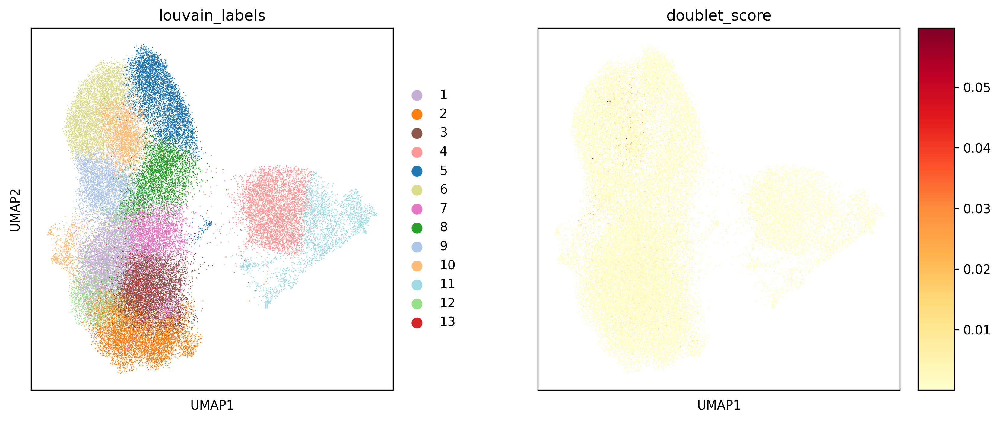

In [18]:
pg.scatter(data,attrs=['louvain_labels','doublet_score'], basis='umap')

In [19]:
#see which cluster has the doublets
data.uns['pred_dbl_cluster']

,cluster,percentage,pval,qval
0,10,27.860027,0.000006,0.000015
1,9,10.345953,0.000006,0.000015
2,6,9.299517,0.000020,0.000032


In [20]:
#doublets should be between 2-5% according to 10x estimated counts
pg.mark_doublets(data)
data.obs['demux_type'].value_counts()

singlet    41349
doublet     3375
Name: demux_type, dtype: int64

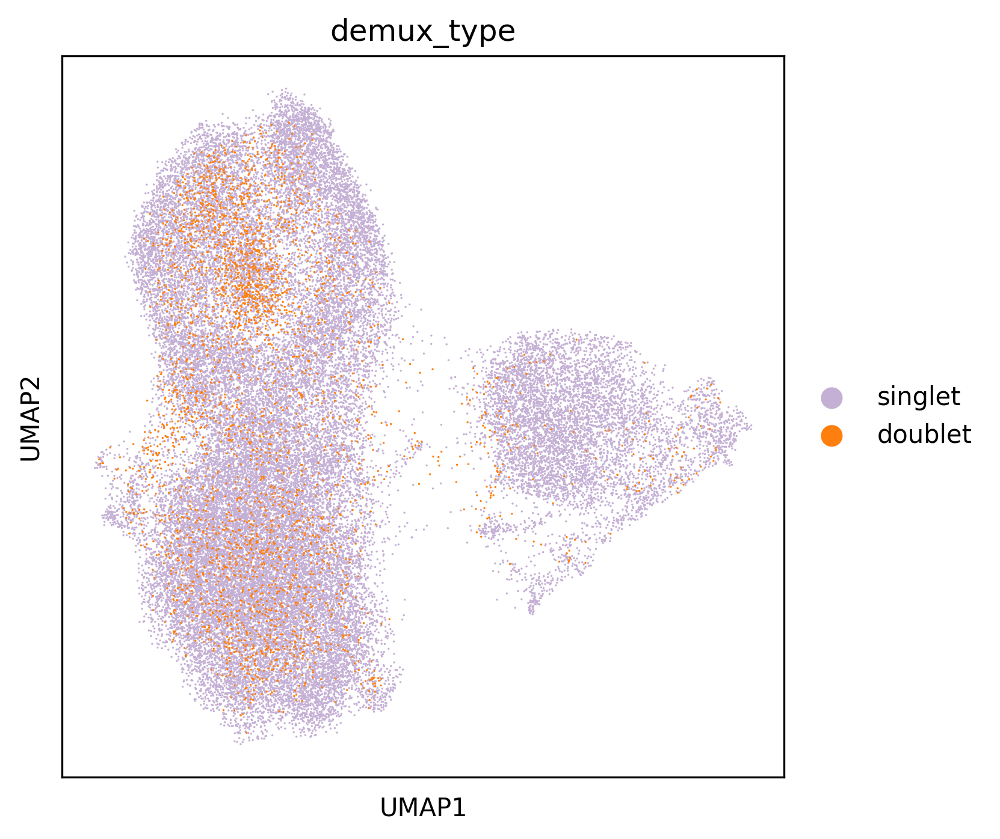

In [21]:
pg.scatter(data,attrs=['demux_type'], basis='umap', wspace=1.2) 

In [22]:
#actually remove the doublets
pg.qc_metrics(data, select_singlets=True)
pg.filter_data(data)

2022-08-02 09:59:55,364 - pegasusio.qc_utils - INFO - After filtration, 41349 out of 44724 cell barcodes are kept in UnimodalData object Homo_sapiens.GRCh38.104.chr.protein_coding-rna.
2022-08-02 09:59:55,365 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 2.25s.


In [23]:
#re-process with doublets removed
pg.highly_variable_features(data, batch='Channel')
pg.pca(data)
pca_key = pg.run_harmony(data)
pg.neighbors(data,rep=pca_key)


2022-08-02 09:59:56,449 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 1.08s.
2022-08-02 09:59:56,478 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2022-08-02 09:59:56,479 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 1.11s.
2022-08-02 10:00:01,896 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 5.42s.
2022-08-02 10:00:01,897 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
2022-08-02 10:00:19,056 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 17.16s.
2022-08-02 10:00:28,085 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 9.03s.
2022-08-02 10:00:29,532 - pegasus.tools.nearest_neighbors - INFO -

In [24]:
pg.louvain(data,rep=pca_key, resolution=0.4)
pg.umap(data,rep=pca_key)

2022-08-02 10:00:30,917 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 1.37s.
2022-08-02 10:01:00,351 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 4 clusters.
2022-08-02 10:01:00,395 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 30.85s.
2022-08-02 10:01:00,396 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2022-08-02 10:01:00,396 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, precomputed_knn=(array([[    0, 5376, 222, ..., 17574, 620, 975],
       [    1, 2141, 2731, ..., 5226, 1419, 5258],
       [    2, 32, 2886, ..., 3429, 26021, 28368],
       ...,
       [41346, 10050, 21350, ..., 38229, 20142, 20019],
       [41347, 39131, 38832, ..., 40081, 39423, 39996],
       [41348, 41319, 39557, ..., 23468, 39856, 24839]]), array([[ 0.       , 8.31117  , 8.356263 , ..., 8.885376 , 8.939431 ,
         8.9794

Epochs completed:   0%|            0/200 [00:00]

Tue Aug  2 10:01:24 2022 Finished embedding
2022-08-02 10:01:24,730 - pegasus.tools.visualization - INFO - Function 'umap' finished in 24.33s.


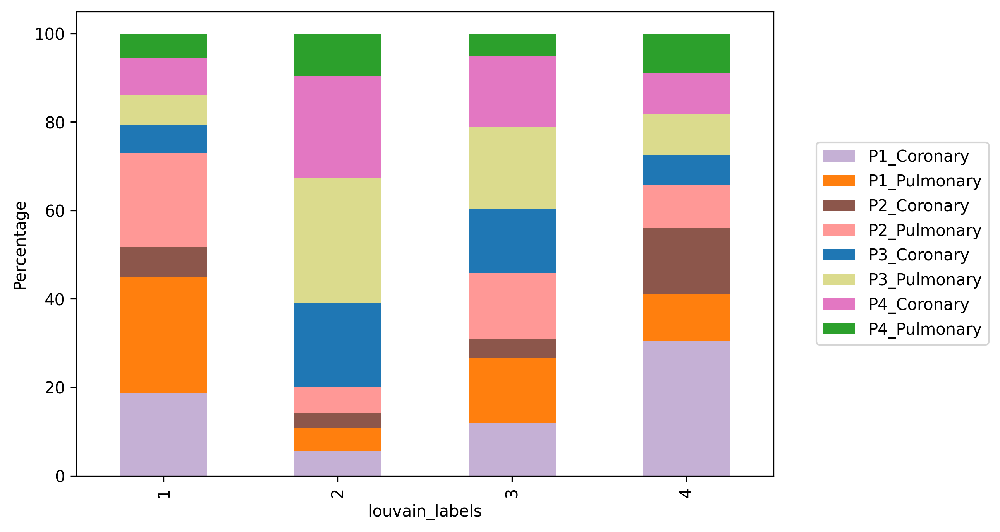

In [25]:
pg.compo_plot(data, 'louvain_labels', 'Channel')

We see a very even distribution of samples across all 4 identified louvain clusters

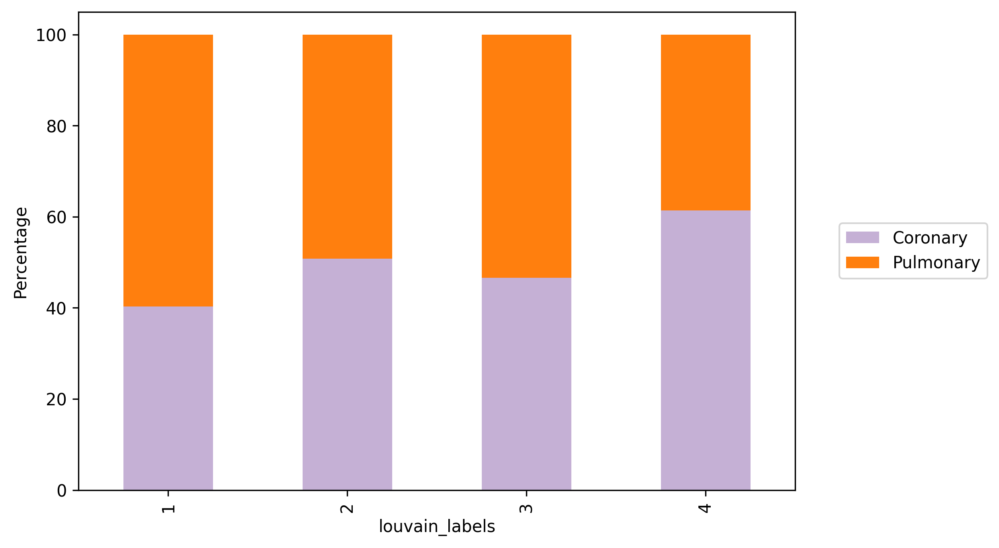

In [26]:
pg.compo_plot(data, 'louvain_labels', 'Tissue')

Additionally, there is an even distribution of both arteries across all louvain clusters

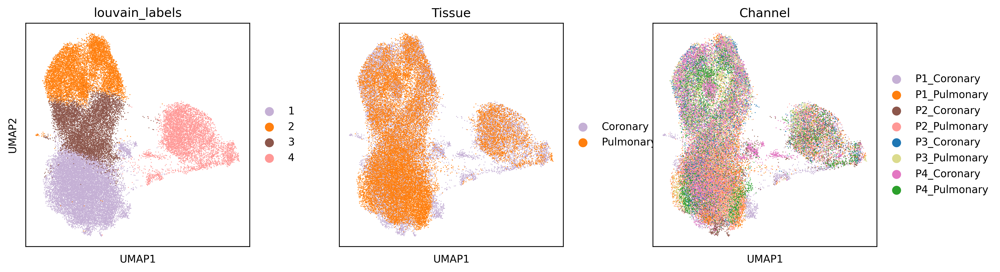

In [27]:
pg.scatter(data, attrs=['louvain_labels', 'Tissue', 'Channel'], basis='umap', panel_size=(3, 3), nrows=1, dpi=300)

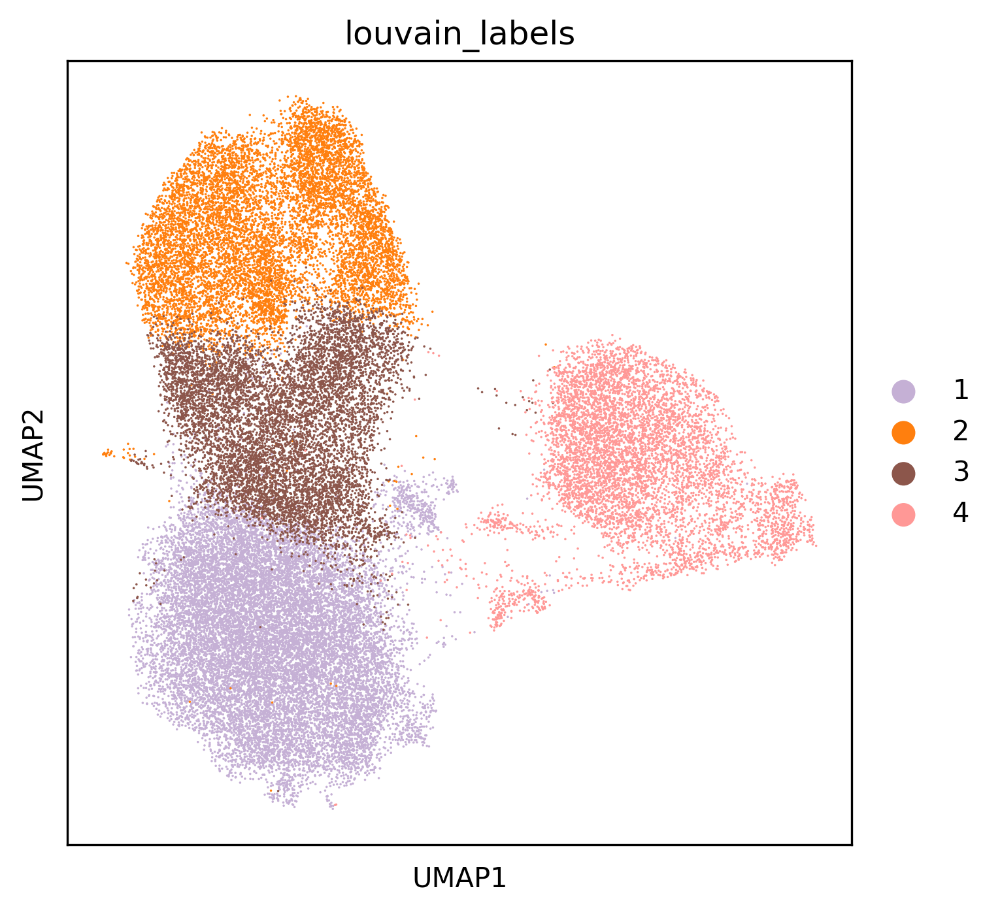

In [28]:
pg.scatter(data, attrs=['louvain_labels'])

In [29]:
#create the diffusion map and plot pseudotime trajectories
pg.diffmap(data, rep=pca_key)
pg.fle(data)

2022-08-02 10:01:27,519 - pegasus.tools.diffusion_map - INFO - Calculating connected components is done.
2022-08-02 10:01:27,753 - pegasus.tools.diffusion_map - INFO - Calculating normalized affinity matrix is done.
2022-08-02 10:01:41,876 - pegasus.tools.diffusion_map - INFO - Detected knee point at t = 125.
2022-08-02 10:01:41,931 - pegasus.tools.diffusion_map - INFO - Function 'diffmap' finished in 14.47s.
2022-08-02 10:01:48,658 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 6.73s.
2022-08-02 10:01:49,420 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.76s.
2022-08-02 10:01:49,934 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.51s.


Aug 02, 2022 10:01:51 AM org.netbeans.modules.masterfs.watcher.Watcher getNotifierForPlatform
INFO: Native file watcher is disabled
Aug 02, 2022 10:01:55 AM org.gephi.io.processor.plugin.DefaultProcessor process
INFO: # Nodes loaded: 41,349
Aug 02, 2022 10:01:55 AM org.gephi.io.processor.plugin.DefaultProcessor process
INFO: # Edges loaded: 1,287,728


100 iterations, change_per_node = 134.99927633301854
200 iterations, change_per_node = 121.55318347337699


300 iterations, change_per_node = 53.24846000716079
400 iterations, change_per_node = 47.08963689670545
500 iterations, change_per_node = 24.380834738966524
600 iterations, change_per_node = 19.385287626644274
700 iterations, change_per_node = 14.83039578923002
800 iterations, change_per_node = 19.472557601904537
900 iterations, change_per_node = 9.073603624744605
1000 iterations, change_per_node = 12.652623343846491
1100 iterations, change_per_node = 12.4615612492061
1200 iterations, change_per_node = 8.44597761233154
1300 iterations, change_per_node = 9.103967921858263
1400 iterations, change_per_node = 12.294521306029019
1500 iterations, change_per_node = 7.630344277010857
1600 iterations, change_per_node = 10.433056644542111
1700 iterations, change_per_node = 11.166390042675946
1800 iterations, change_per_node = 6.035600885725792
1900 iterations, change_per_node = 4.922503422909337
2000 iterations, change_per_node = 7.119152481761659
2100 iterations, change_per_node = 10.3715655638

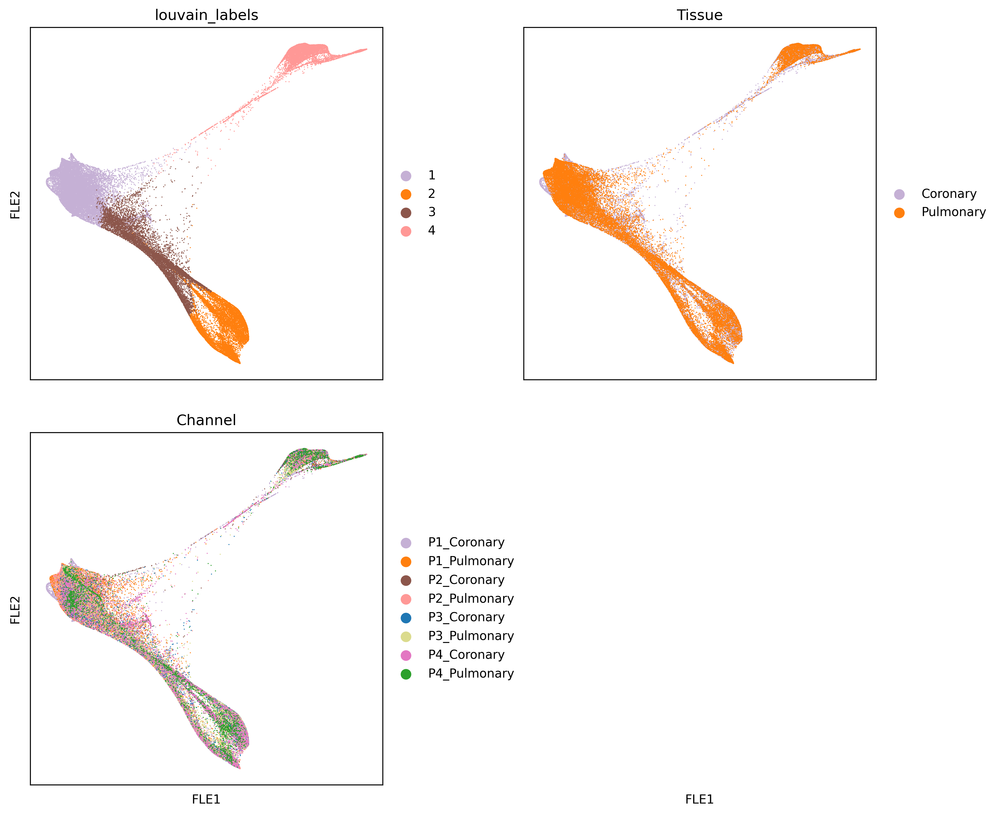

In [30]:
pg.scatter(data, attrs=['louvain_labels', 'Tissue', 'Channel'], basis='fle')

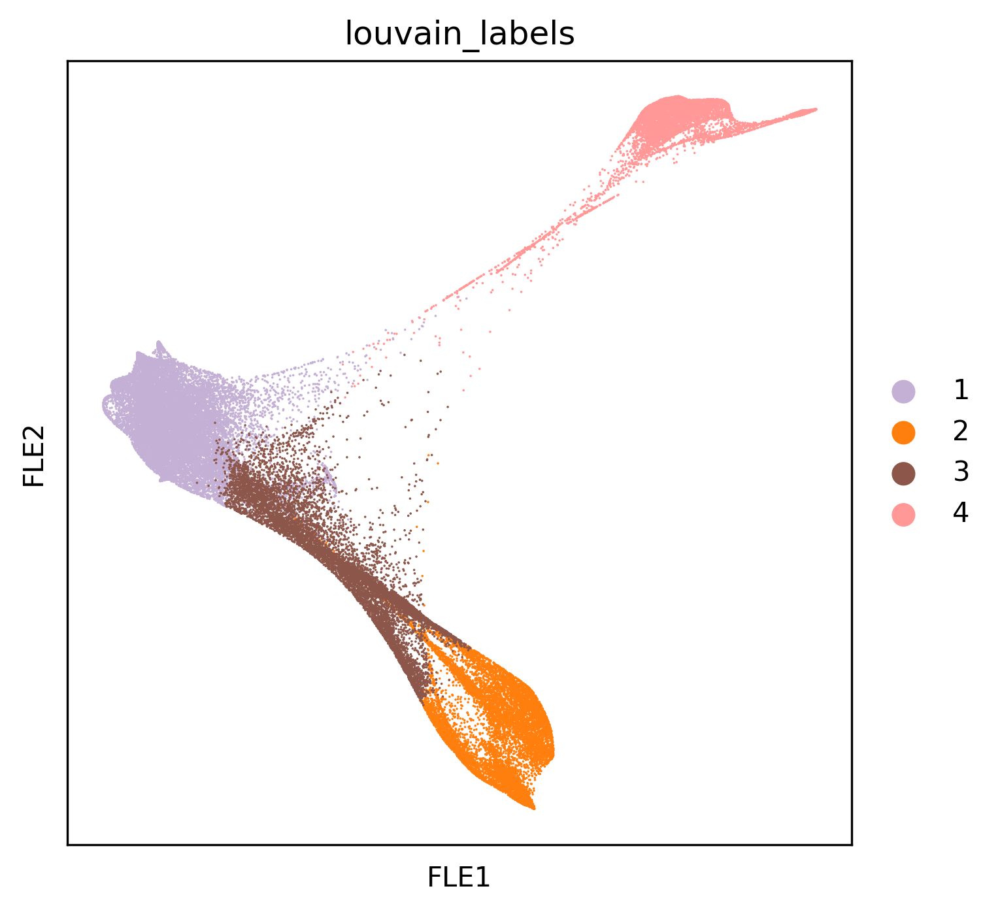

In [31]:
pg.scatter(data, attrs=['louvain_labels'], basis='fle')

In [ ]:
#save as h5ad to open into scanpy for splicing and downstream processing
#this was not the file input into Cell Rank. This was used for further subsetting
pg.write_output(data, 'VSMC/PC_miQC/PC_miqc_Harmony_Control_VSMC_all_patients.h5ad')

# Subset - Select for VSMCs Undergoing Differentiation

Both clustering and differentiation embedding illustrates a clear cell type shared across all samples that is seperated from the rest of the Vascular Smooth Muscle Cells (VSMCs)

Because we are interested in the VSMCs that are undergoing phenotypic switching, we are going to select only for cell types that are clearly connected within the knn graph. 

While the single cell isolation prep was designed to only select for VSMCs, it is not always 100% efficient. Other publications have shown the contamination with endothelial cells or immune cells. This further supports the selection of the primary VSMC population. 

In [33]:
#open the cleaned data to splice the subgroups
adata = sc.read_h5ad('VSMC/PC_miQC/PC_miqc_Harmony_Control_VSMC_all_patients.h5ad')
adata

AnnData object with n_obs × n_vars = 41349 × 16168
    obs: 'n_genes', 'n_counts', 'percent_mito', 'Channel', 'scale', 'louvain_labels', 'Tissue', 'doublet_score', 'pred_dbl'
    var: 'featureid', 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'PCs', '_attr2type', 'diffmap_evals', 'genome', 'louvain_resolution', 'modality', 'ncells', 'norm_count', 'pca', 'pca_features', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'diffmap_knn_distances', 'diffmap_knn_indices', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices'
    varm: 'means', 'partial_sum'
    obsp: 'W_diffmap', 'W_pca_harmony'

In [34]:
adata.obs['louvain_labels'].value_counts()

1    16821
2     9489
3     8580
4     6459
Name: louvain_labels, dtype: int64

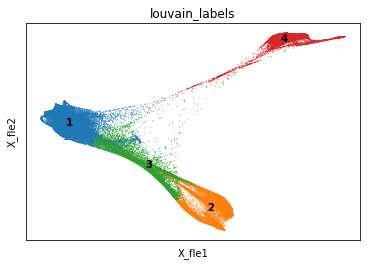

In [35]:
#just to visually confirm we are splicing the proper cells
sc.pl.embedding(adata, basis='X_fle',color=['louvain_labels'], legend_loc='on data')

In [36]:
#select and read into a list the barcodes only associated with those top groups
to_splice = ['1','2','3']
sub = adata.obs[adata.obs['louvain_labels'].isin(to_splice)]
sub['louvain_labels'].value_counts()

1    16821
2     9489
3     8580
4        0
Name: louvain_labels, dtype: int64

In [37]:
#read those barcodes into a list 
keep_cells = list(sub.index)
print(len(keep_cells))

34890


In [38]:
#this is for splicing the file and using the already calculated information 
adata.obs['splice']='null'
adata.obs.loc[adata.obs.index.isin(keep_cells), 'splice'] = 'Yes'
sub_data = adata[adata.obs['splice'] == 'Yes', :]
sub_data.obs['value'] = 0 
sub_data

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_37839/14549416.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub_data.obs['value'] = 0


AnnData object with n_obs × n_vars = 34890 × 16168
    obs: 'n_genes', 'n_counts', 'percent_mito', 'Channel', 'scale', 'louvain_labels', 'Tissue', 'doublet_score', 'pred_dbl', 'splice', 'value'
    var: 'featureid', 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'PCs', '_attr2type', 'diffmap_evals', 'genome', 'louvain_resolution', 'modality', 'ncells', 'norm_count', 'pca', 'pca_features', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'louvain_labels_colors'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'diffmap_knn_distances', 'diffmap_knn_indices', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices'
    varm: 'means', 'partial_sum'
    obsp: 'W_diffmap', 'W_pca_harmony'

In [39]:
#write spliced anndata into new file
sub_data.write('VSMC/PC_miQC/PC_miQC_subtypes_Control_VSMC_all_patients.h5ad')